<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="300" alt="cognitiveclass.ai logo">
</center>

# Simple APIs 
## Random User and Fruitvice API Examples


Estimated time needed: **25** minutes

## Objectives

After completing this lab you will be able to:

*   Load and use RandomUser API, using `RandomUser()` Python library
*   Load and use Fruitvice API, using `requests` Python library



The purpose of this notebook is to provide more examples on how to use simple APIs. As you have already learned from previous videos and notebooks, API stands for Application Programming Interface and is a software intermediary that allows two applications to talk to each other. 

The advantages of using APIs:
 *   **Automation**. Less human effort is required and workflows can be easily updated to become faster and more      
     productive.
 *   **Efficiency**. It allows to use the capabilities of one of the already developed APIs than to try to 
     independently implement some functionality from scratch.
 
The disadvantage of using APIs:
 *   **Security**. If the API is poorly integrated, it means it will be vulnerable to attacks, resulting in data breeches or losses having financial or reputation implications.

One of the applications we will use in this notebook is Random User Generator. RandomUser is an open-source, free API providing developers with randomly generated users to be used as placeholders for testing purposes. This makes the tool similar to Lorem Ipsum, but is a placeholder for people instead of text. The API can return multiple results, as well as specify generated user details such as gender, email, image, username, address, title, first and last name, and more. More information on [RandomUser](https://randomuser.me/documentation?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkPY0101ENSkillsNetwork1005-2023-01-01#intro) can be found here.

Another example of simple API we will use in this notebook is Fruitvice application. The Fruitvice API webservice which provides data for all kinds of fruit! You can use Fruityvice to find out interesting information about fruit and educate yourself. The webservice is completely free to use and contribute to.


## Example 1: RandomUser API
Bellow are Get Methods parameters that we can generate. For more information on the parameters, please visit this [documentation](https://randomuser.me/documentation?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkPY0101ENSkillsNetwork1005-2023-01-01) page.


## **Get Methods**

- get_cell()
- get_city()
- get_dob()
- get_email()
- get_first_name()
- get_full_name()
- get_gender()
- get_id()
- get_id_number()
- get_id_type()
- get_info()
- get_last_name()
- get_login_md5()
- get_login_salt()
- get_login_sha1()
- get_login_sha256()
- get_nat()
- get_password()
- get_phone()
- get_picture()
- get_postcode()
- get_registered()
- get_state()
- get_street()
- get_username()
- get_zipcode()


To start using the API you can install the `randomuser` library running the `pip install` command.


In [1]:
!pip install randomuser


[notice] A new release of pip is available: 23.3 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for randomuser: filename=randomuser-1.6-py3-none-any.whl size=5093 sha256=9ec6d5939578136c8206ff572bfbb20f1168a15daf8570cd1cc2fd8bd47600ee
  Stored in directory: c:\users\thiago\appdata\local\pip\cache\wheels\be\62\c8\71e1b48f4758ea5b78af7595d87178f628cde315a3326610ee
Successfully built randomuser


Then, we will load the necessary libraries.


In [13]:
from randomuser import RandomUser
import requests
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
import io

First, we will create a random user object, r.


In [3]:
r = RandomUser()

Then, using `generate_users()` function, we get a list of random 10 users.


In [4]:
some_list = r.generate_users(10)

In [5]:
some_list

The **"Get Methods"** functions mentioned at the beginning of this notebook, can generate the required parameters to construct a dataset. For example, to get full name, we call `get_full_name()` function.


In [6]:
name = r.get_full_name()

Let's say we only need 10 users with full names and their email addresses. We can write a "for-loop" to print these 10 users.


In [7]:
for user in some_list:
    print (user.get_full_name()," ",user.get_email())

Lilli Gautier   lilli.gautier@example.com
Borja Nieto   borja.nieto@example.com
Silke Olsen   silke.olsen@example.com
Theres Gärtner   theres.gartner@example.com
Hibo Beunder   hibo.beunder@example.com
Grete Grebe   grete.grebe@example.com
Isaac Martinez   isaac.martinez@example.com
Alexandre Bélanger   alexandre.belanger@example.com
Iiris Koski   iiris.koski@example.com
Kathleen Lee   kathleen.lee@example.com


## Exercise 1
In this Exercise, generate photos of the random 5 users.


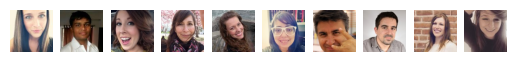

In [15]:
## Write your c
pictures = []
for user in some_list:
    # Download the user's picture
    picture_link = user.get_picture()
    response = requests.get(picture_link)
    picture_data = response.content

    # Create a PIL image
    picture = Image.open(io.BytesIO(picture_data))

    # Add the image in the array
    pictures.append(picture)
    
fig, axs = plt.subplots(1, 10)
for i,picture in enumerate(pictures):
    axs[i].imshow(picture)
    axs[i].axis('off')
plt.show()

<details><summary>Click here for the solution</summary>

```python
for user in some_list:
    print (user.get_picture())
```

</details>


To generate a table with information about the users, we can write a function containing all desirable parameters. For example, name, gender, city, etc. The parameters will depend on the requirements of the test to be performed. We call the Get Methods, listed at the beginning of this notebook. Then, we return pandas dataframe with the users.


In [17]:
def get_users():
    users =[]
     
    for user in RandomUser.generate_users(10):
        users.append({"Name":user.get_full_name(),"Gender":user.get_gender(),"City":user.get_city(),"State":user.get_state(),"Email":user.get_email(), "DOB":user.get_dob(),"Picture":user.get_picture()})
      
    return pd.DataFrame(users)     

In [18]:
get_users()

,Name,Gender,City,State,Email,DOB,Picture
0,Alexandra Roberts,female,Clonmel,Westmeath,alexandra.roberts@example.com,1944-09-22T05:03:09.807Z,https://randomuser.me/api/portraits/women/72.jpg
1,Milia Kausar,female,Leitebakk,Sør-Trøndelag,milia.kausar@example.com,1964-02-12T13:56:44.523Z,https://randomuser.me/api/portraits/women/76.jpg
2,David Turner,male,Nelson,Hawke'S Bay,david.turner@example.com,1977-03-25T15:49:10.870Z,https://randomuser.me/api/portraits/men/29.jpg
3,پارمیس سهيلي راد,female,اراک,مرکزی,prmys.shylyrd@example.com,1972-09-28T04:03:25.540Z,https://randomuser.me/api/portraits/women/1.jpg
4,Roy Johnston,male,Kansas City,Arizona,roy.johnston@example.com,1952-03-08T19:35:24.737Z,https://randomuser.me/api/portraits/men/23.jpg
5,Nalan Ayaydın,female,Osmaniye,Tunceli,nalan.ayaydin@example.com,1994-02-23T01:29:20.974Z,https://randomuser.me/api/portraits/women/7.jpg
6,Roope Peura,male,Utajärvi,Ostrobothnia,roope.peura@example.com,1947-07-26T10:36:50.024Z,https://randomuser.me/api/portraits/men/52.jpg
7,Filippa Larsen,female,Hornbæk,Syddanmark,filippa.larsen@example.com,1944-11-01T23:43:09.319Z,https://randomuser.me/api/portraits/women/91.jpg
8,Aino Rantanen,female,Merijärvi,Kainuu,aino.rantanen@example.com,1952-11-19T01:29:54.724Z,https://randomuser.me/api/portraits/women/85.jpg
9,الینا یاسمی,female,سنندج,البرز,lyn.ysmy@example.com,1969-03-23T04:09:11.144Z,https://randomuser.me/api/portraits/women/10.jpg


In [19]:
df1 = pd.DataFrame(get_users())  

Now we have a *pandas* dataframe that can be used for any testing purposes that the tester might have.


## Example 2: Fruitvice API

Another, more common way to use APIs, is through `requests` library. The next lab, Requests and HTTP, will contain more information about requests.

We will start by importing all required libraries.


In [20]:
import requests
import json

We will obtain the [fruitvice](https://www.fruityvice.com/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkPY0101ENSkillsNetwork1005-2023-01-01) API data using `requests.get("url")` function. The data is in a json format.


In [21]:
data = requests.get("https://fruityvice.com/api/fruit/all")

We will retrieve results using `json.loads()` function.


In [22]:
results = json.loads(data.text)

We will convert our json data into *pandas* data frame. 


In [23]:
pd.DataFrame(results)

,name,id,family,order,genus,nutritions
0,Persimmon,52,Ebenaceae,Rosales,Diospyros,"{'calories': 81, 'fat': 0.0, 'sugar': 18.0, 'c..."
1,Strawberry,3,Rosaceae,Rosales,Fragaria,"{'calories': 29, 'fat': 0.4, 'sugar': 5.4, 'ca..."
2,Banana,1,Musaceae,Zingiberales,Musa,"{'calories': 96, 'fat': 0.2, 'sugar': 17.2, 'c..."
3,Tomato,5,Solanaceae,Solanales,Solanum,"{'calories': 74, 'fat': 0.2, 'sugar': 2.6, 'ca..."
4,Pear,4,Rosaceae,Rosales,Pyrus,"{'calories': 57, 'fat': 0.1, 'sugar': 10.0, 'c..."
5,Durian,60,Malvaceae,Malvales,Durio,"{'calories': 147, 'fat': 5.3, 'sugar': 6.75, '..."
6,Blackberry,64,Rosaceae,Rosales,Rubus,"{'calories': 40, 'fat': 0.4, 'sugar': 4.5, 'ca..."
7,Lingonberry,65,Ericaceae,Ericales,Vaccinium,"{'calories': 50, 'fat': 0.34, 'sugar': 5.74, '..."
8,Kiwi,66,Actinidiaceae,Struthioniformes,Apteryx,"{'calories': 61, 'fat': 0.5, 'sugar': 9.0, 'ca..."
9,Lychee,67,Sapindaceae,Sapindales,Litchi,"{'calories': 66, 'fat': 0.44, 'sugar': 15.0, '..."


The result is in a nested json format. The 'nutrition' column contains multiple subcolumns, so the data needs to be 'flattened' or normalized.


In [24]:
df2 = pd.json_normalize(results)

In [25]:
df2

,name,id,family,order,genus,nutritions.calories,nutritions.fat,nutritions.sugar,nutritions.carbohydrates,nutritions.protein
0,Persimmon,52,Ebenaceae,Rosales,Diospyros,81,0.00,18.00,18.00,0.00
1,Strawberry,3,Rosaceae,Rosales,Fragaria,29,0.40,5.40,5.50,0.80
2,Banana,1,Musaceae,Zingiberales,Musa,96,0.20,17.20,22.00,1.00
3,Tomato,5,Solanaceae,Solanales,Solanum,74,0.20,2.60,3.90,0.90
4,Pear,4,Rosaceae,Rosales,Pyrus,57,0.10,10.00,15.00,0.40
5,Durian,60,Malvaceae,Malvales,Durio,147,5.30,6.75,27.10,1.50
6,Blackberry,64,Rosaceae,Rosales,Rubus,40,0.40,4.50,9.00,1.30
7,Lingonberry,65,Ericaceae,Ericales,Vaccinium,50,0.34,5.74,11.30,0.75
8,Kiwi,66,Actinidiaceae,Struthioniformes,Apteryx,61,0.50,9.00,15.00,1.10
9,Lychee,67,Sapindaceae,Sapindales,Litchi,66,0.44,15.00,17.00,0.80


Let's see if we can extract some information from this dataframe. Perhaps, we need to know the family and genus of a cherry.


In [26]:
cherry = df2.loc[df2["name"] == 'Cherry']
(cherry.iloc[0]['family']) , (cherry.iloc[0]['genus'])

('Rosaceae', 'Prunus')

## Exercise 2
In this Exercise, find out how many calories are contained in a banana.


In [28]:
# Write your code here
banana = df2.loc[df2["name"] == 'Banana']
(banana.iloc[0]['name']) , (banana.iloc[0]['nutritions.calories'])

('Banana', 96)

<details><summary>Click here for the solution</summary>

```python
cal_banana = df2.loc[df2["name"] == 'Banana']
cal_banana.iloc[0]['nutritions.calories']
```

</details>


## Exercise 3

This [page](https://github.com/public-apis/public-apis#animals) contains a list of free public APIs. Choose any API of your interest and use it to load/extract some information, as shown in the example above.
1. Using `requests.get("url")` function, load your data.


In [32]:
# Write your code here
url = 'https://db.ygoprodeck.com/api/v7/cardinfo.php'
yugiho_cards = requests.get(url)

print(yugiho_cards.text)

{"data":[{"id":34541863,"name":"\"A\" Cell Breeding Device","type":"Spell Card","frameType":"spell","desc":"During each of your Standby Phases, put 1 A-Counter on 1 face-up monster your opponent controls.","race":"Continuous","archetype":"Alien","card_sets":[{"set_name":"Force of the Breaker","set_code":"FOTB-EN043","set_rarity":"Common","set_rarity_code":"(C)","set_price":"1.31"}],"card_images":[{"id":34541863,"image_url":"https://images.ygoprodeck.com/images/cards/34541863.jpg","image_url_small":"https://images.ygoprodeck.com/images/cards_small/34541863.jpg","image_url_cropped":"https://images.ygoprodeck.com/images/cards_cropped/34541863.jpg"}],"card_prices":[{"cardmarket_price":"0.14","tcgplayer_price":"0.19","ebay_price":"0.99","amazon_price":"24.45","coolstuffinc_price":"0.25"}]},{"id":64163367,"name":"\"A\" Cell Incubator","type":"Spell Card","frameType":"spell","desc":"Each time an A-Counter(s) is removed from play by a card effect, place 1 A-Counter on this card. When this card

<details><summary>Click here for the solution</summary>

```python
data2 = requests.get("https://cat-fact.herokuapp.com/facts")
```

</details>


2. Retrieve results using `json.loads()` function.


In [ ]:
# Write your code here


<details><summary>Click here for the solution</summary>

```python
results2 = json.loads(data2.text)
```

</details>


3. Convert json data into *pandas* data frame. 


In [ ]:
# Write your code here


<details><summary>Click here for the solution</summary>

```python
df3 = pd.DataFrame(results2)
df3.drop(columns="status",inplace=True)
df3
```

</details>


# Congratulations! - You have completed the lab


## Author
[Svitlana Kramar](www.linkedin.com/in/svitlana-kramar)


Svitlana is a master’s degree Data Science and Analytics student at University of Calgary, who enjoys travelling, learning new languages and cultures and loves spreading her passion for Data Science.


                                Copyright © 2020 IBM Corporation. All rights reserved.
